In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from imblearn.over_sampling import RandomOverSampler
from tensorflow.keras import layers, Model
from tensorflow.keras.utils import to_categorical
from sklearn.utils import shuffle

# Paths
classification_dir = r"D:\RESEARCH_WORK\Teeth_Segmentation_Project\Dataset\Merged_dataset\classification_dataset"

# Parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 20
LEARNING_RATE = 0.0001

In [2]:
# Function to load dataset
def load_classification_data(directory):
    images = []
    labels = []
    for file in os.listdir(directory):
        if file.endswith((".jpg", ".png", ".jpeg")):
            label = int(file.split('_')[1][0])  # Extract label (0 or 1)
            img_path = os.path.join(directory, file)
            img = tf.keras.preprocessing.image.load_img(img_path, target_size=IMG_SIZE)
            img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0  # Normalize to [0, 1]
            images.append(img_array)
            labels.append(label)
    return np.array(images), np.array(labels)

# Load data
X, y = load_classification_data(classification_dir)

# Shuffle dataset
X, y = shuffle(X, y, random_state=42)

# Train-validation-test split (8:1:1)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

print(f"Training set shape: {X_train.shape}, {y_train.shape}")
print(f"Validation set shape: {X_val.shape}, {y_val.shape}")
print(f"Test set shape: {X_test.shape}, {y_test.shape}")

# Apply Random Over Sampler
ros = RandomOverSampler(random_state=42)
X_train_flat = X_train.reshape((X_train.shape[0], -1))  # Flatten for oversampling
X_train_resampled, y_train_resampled = ros.fit_resample(X_train_flat, y_train)
X_train_resampled = X_train_resampled.reshape((-1, IMG_SIZE[0], IMG_SIZE[1], 3))  # Reshape back

Training set shape: (554, 224, 224, 3), (554,)
Validation set shape: (69, 224, 224, 3), (69,)
Test set shape: (70, 224, 224, 3), (70,)


In [3]:
# CNN + ViT Model
def create_cnn_vit_model():
    # CNN Layers
    cnn_input = layers.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(cnn_input)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    cnn_output = layers.Flatten()(x)
    
    # ViT Layer
    vit_input = layers.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
    vit_patches = layers.Conv2D(8, (16, 16), strides=(16, 16), padding='valid')(vit_input)  # Patch embedding
    vit_patches = layers.Reshape((-1, vit_patches.shape[-1]))(vit_patches)  # Reshape into sequence
    vit_output = layers.MultiHeadAttention(num_heads=4, key_dim=8)(vit_patches, vit_patches)
    vit_output = layers.GlobalAveragePooling1D()(vit_output)
    
    # Concatenate CNN and ViT
    combined = layers.Concatenate()([cnn_output, vit_output])
    combined = layers.Dense(128, activation='relu')(combined)
    combined = layers.Dropout(0.5)(combined)
    output = layers.Dense(1, activation='sigmoid')(combined)  # Binary classification
    
    model = Model(inputs=[cnn_input, vit_input], outputs=output)
    return model

In [4]:
# Compile the model
model = create_cnn_vit_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    [X_train_resampled, X_train_resampled], y_train_resampled,
    validation_data=([X_val, X_val], y_val),
    batch_size=BATCH_SIZE,
    epochs=EPOCHS
)

Epoch 1/20


D:\CSE299\Flutter\Anaconda\envs\Research\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor', 'keras_tensor_8']. Received: the structure of inputs=('*', '*')
  warnings.warn(


28/28 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.5051 - loss: 0.7516 - val_accuracy: 0.4203 - val_loss: 0.6934
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.5111 - loss: 0.6915 - val_accuracy: 0.7971 - val_loss: 0.6749
Epoch 3/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.5185 - loss: 0.6889 - val_accuracy: 0.3478 - val_loss: 0.7041
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.5875 - loss: 0.6849 - val_accuracy: 0.8116 - val_loss: 0.6369
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.6076 - loss: 0.6655 - val_accuracy: 0.4928 - val_loss: 0.6842
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step - accuracy: 0.6758 - loss: 0.6226 - val_accuracy: 0.7681 - val_loss: 0.6033
Epoch 7/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.6760 - loss: 0.6036 - val_accuracy: 0.7536 - val_loss: 0.5892
Epoch 8/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.7675 - loss: 0.5237 - val_accuracy: 0.5217 - val_loss: 0.7091
Epo

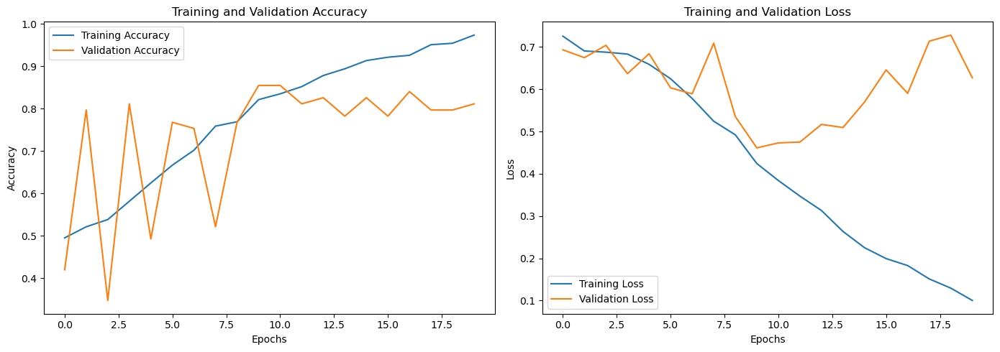

In [5]:
# Plot Accuracy and Loss Curves
def plot_training_curves(history):
    plt.figure(figsize=(14, 5))
    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_curves(history)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 172ms/step
Classification Report:
                   precision    recall  f1-score   support

     No Impaction       0.83      0.88      0.85        56
Angular Impaction       0.36      0.29      0.32        14

         accuracy                           0.76        70
        macro avg       0.60      0.58      0.59        70
     weighted avg       0.74      0.76      0.75        70



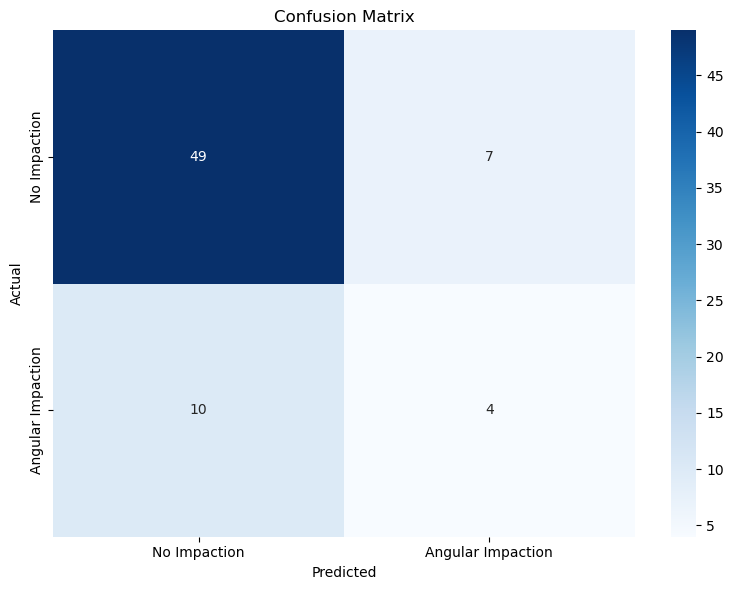

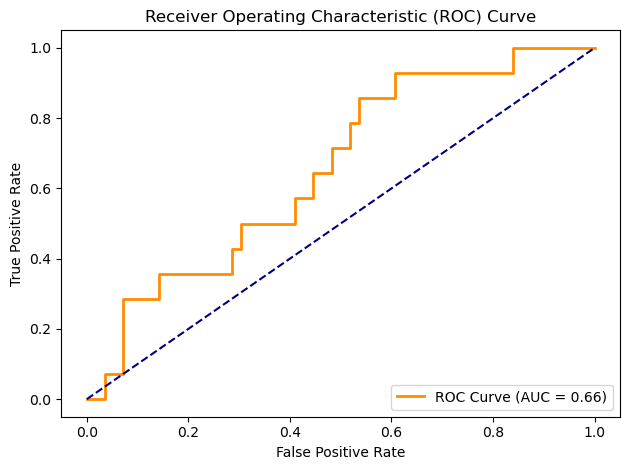

In [23]:
# Evaluate the model
y_pred_prob = model.predict([X_test, X_test])
y_pred = (y_pred_prob > 0.5).astype(int)

# Metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=["No Impaction", "Angular Impaction"]))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["No Impaction", "Angular Impaction"], yticklabels=["No Impaction", "Angular Impaction"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.savefig("confusion_matrix_cnn_vit.png")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig("roc_curve_cnn_vit.png")
plt.show()

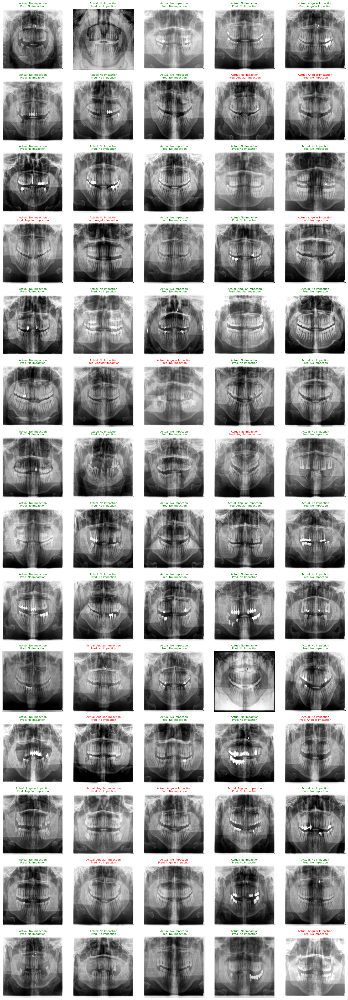

In [24]:
import math

# Define class labels
class_labels = ["No Impaction", "Angular Impaction"]

# Set number of images to display (all test images)
num_images = len(X_test)

# Determine grid size (rows & cols)
cols = 5  # Number of columns
rows = math.ceil(num_images / cols)  # Calculate required rows

plt.figure(figsize=(cols * 3, rows * 3))  # Adjust figure size dynamically

for i in range(num_images):
    plt.subplot(rows, cols, i + 1)  # Adjust grid dynamically
    plt.imshow(X_test[i])  # Display image
    plt.axis("off")

    # Get actual and predicted labels
    actual_label = class_labels[y_test[i]]
    predicted_label = class_labels[y_pred[i][0]]

    # Set title with actual vs predicted labels
    color = "green" if actual_label == predicted_label else "red"  # Green if correct, red if wrong
    plt.title(f"Actual: {actual_label}\nPred: {predicted_label}", fontsize=8, color=color)

plt.tight_layout()
plt.show() 

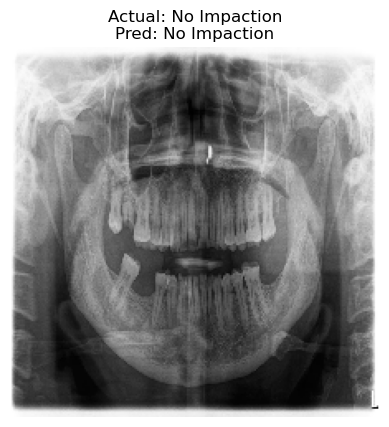

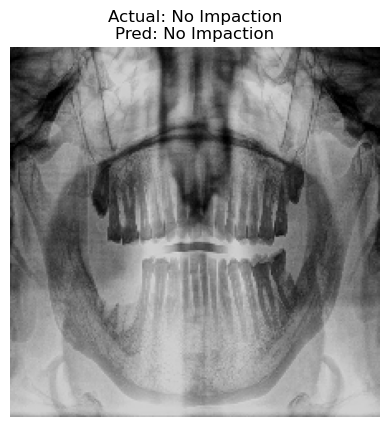

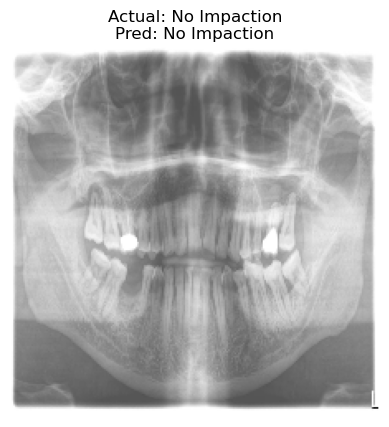

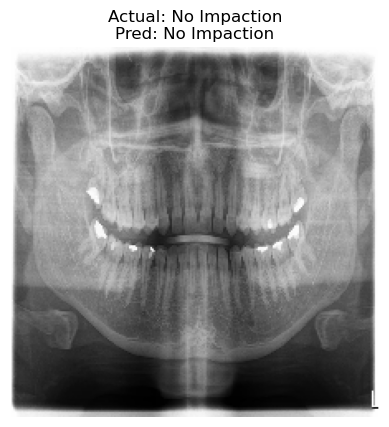

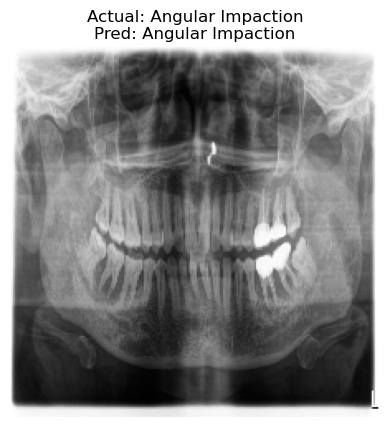

...

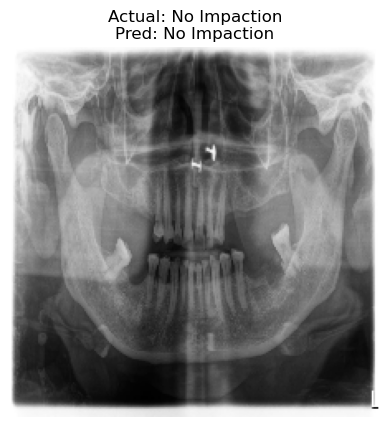

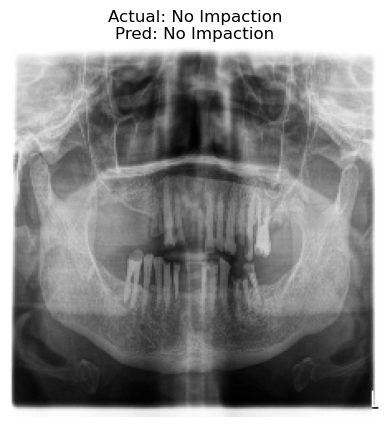

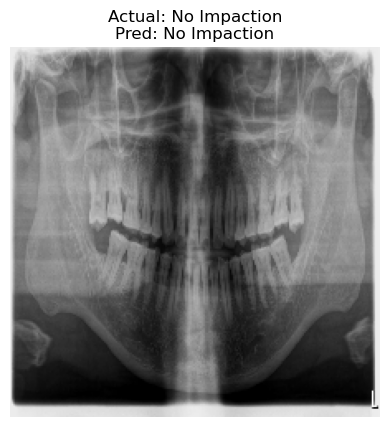

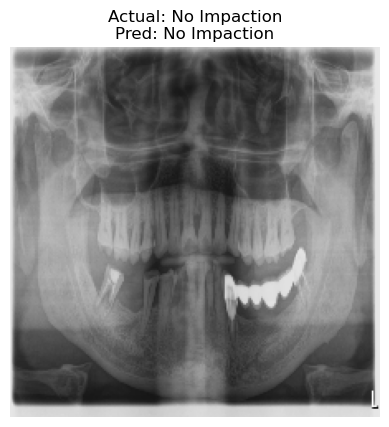

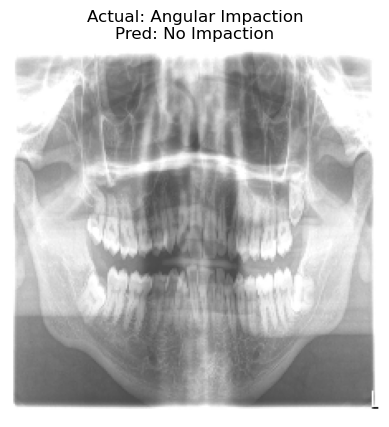

Images have been saved in the directory: evaluated_images


In [25]:

import cv2

import os
import cv2
from matplotlib import pyplot as plt

# Create a directory to save images
output_dir = "evaluated_images"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Define class labels
class_labels = ["No Impaction", "Angular Impaction"]

# Iterate through test images and save them with original and predicted labels
for i in range(len(X_test)):
    # Get the actual and predicted labels
    actual_label = class_labels[y_test[i]]
    predicted_label = class_labels[y_pred[i][0]]
    
    # Save the image with the label as part of the filename
    img = X_test[i]

    # Convert image if it is in float type for correct saving
    if img.dtype != np.uint8:
        img = (img * 255).astype(np.uint8)

    # Generate a filename based on the actual and predicted labels
    filename = f"{i+1}_Actual_{actual_label}_Pred_{predicted_label}.png"
    file_path = os.path.join(output_dir, filename)

    # Save the image without any text overlay
    cv2.imwrite(file_path, img)

    # Optionally, display the image with the title (without overlaying on the image)
    plt.imshow(img)
    plt.title(f"Actual: {actual_label}\nPred: {predicted_label}")
    plt.axis("off")
    plt.show()

print(f"Images have been saved in the directory: {output_dir}")